# Phase change

In [1]:
function applypercolation(array::Array{Float64, 2})
    nr_y, nr_x = size(array)
    out = deepcopy(array)
    for y in 2:nr_y-1
        for x in 2:nr_x-1
            if out[y, x] > 0.0
                c = array[y-1, x] + array[y, x-1] + array[y, x+1] + array[y+1, x]
                if c ≥ 0.5
                    out[y, x] = 0.5
                end
            end
        end
    end
    out
end

applypercolation (generic function with 1 method)

In [2]:
function createstructure(dim, p) 
    array = zeros(Float64, dim+2, dim+2)
    array[2, 2:dim+1] = ones(Float64, dim)*0.5
    array[3:dim+1, 2:dim+1] = rand(Float64, dim-1, dim)
    for y in 3:dim+1
        for x in 2:dim+1
            if array[y, x] < p
                array[y, x] = 0.1
            else
                array[y, x] = 0.0
            end
        end
    end
    array
end

createstructure (generic function with 1 method)

In [3]:
function testpercolation(array::Array{Float64, 2})
    num_wet = countwet(array)
    while true
        array = applypercolation(array)
        if isbottomwet(array)
            return true
        end
        new_num_wet = countwet(array)
        if num_wet == new_num_wet
            return false
        end
        num_wet = new_num_wet
    end
end

testpercolation (generic function with 1 method)

In [4]:
function countwet(array::Array{Float64, 2})
    count(v->v==0.5, array)
end

countwet (generic function with 1 method)

In [5]:
function isbottomwet(array::Array{Float64, 2})
    count(v->v==0.5, array[end-1,:]) > 0
end

isbottomwet (generic function with 1 method)

In [6]:
function estimateprobpercolation(dim, p, iter)
    tests = Bool[]
    for i in 1:iter
        array = createstructure(dim, p)
        push!(tests, testpercolation(array))
    end
    count(t->t, tests)/iter
end

estimateprobpercolation (generic function with 1 method)

In [12]:
function findcritical(dim, iter)
    p_min = 0.1
    p_max = 0.9
    P_min = estimateprobpercolation(dim, p_min, iter)
    P_max = estimateprobpercolation(dim, p_max, iter)
    while true
        p_new = 0.5*(p_min + p_max)
        P_new = estimateprobpercolation(dim, p_new, iter)
        if P_new < 0.5
            p_min = p_new
            P_min = P_new
        else
            p_max = p_new
            P_max = P_new
        end
        if abs(p_max - p_min) < 0.01
            return p_new
        end
    end
end

findcritical (generic function with 1 method)

In [14]:
findcritical(200, 100)

0.60625

# Fractals

## 1D Cellular Automata

In [15]:
using Plots

In [16]:
function inttorule1dim(val::Int64)
    digs = BitArray(digits(val, base=2))
    for i in length(digs):7
        push!(digs, false)
    end
    digs
end

inttorule1dim (generic function with 1 method)

In [17]:
function applyrule1dim(rule::BitArray{1}, bits::BitArray{1})
    val = 1 + bits[3] + 2*bits[2] + 4*bits[1]
    rule[val]
end

applyrule1dim (generic function with 1 method)

In [18]:
function area1dim(x₀::BitArray{1}, rule::BitArray{1})
    out = [count(v->v, x₀)]
    len = length(x₀)
    for i in 1:len÷2
        x = falses(len)
        for j in 2:len-1
            x[j] = applyrule1dim(rule, x₀[j-1:j+1])
        end
        push!(out, out[end]+count(v->v, x))
        x₀ = x
    end
    out
end

area1dim (generic function with 1 method)

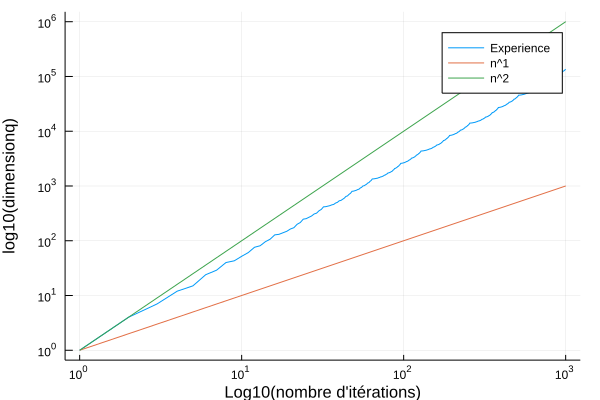

In [28]:
dim = 2001
x₀ = falses(dim)
x₀[dim÷2 + 1] = true
res = area1dim(x₀, inttorule1dim(150))
plot(1:length(res), res, xscale=:log10, yscale=:log10,label="Experience")
plot!(1:length(res), 1:length(res), xscale=:log10, yscale=:log10,label="n^1")
plot!(1:length(res), (1:length(res)).^2, xscale=:log10, yscale=:log10,label="n^2")
plot!(xlabel="Log10(nombre d'itérations)",ylabel="log10(dimensionq)")

## Percolation

In [10]:
function areapercolation(it, p, iter)
    res = Float64[]
    for dim in it
        push!(res, 0.0)
        for i in 1:iter
            array = createstructure(dim, p)
            res[end]+= numberwetpercolation(array)
        end
        res[end] /= iter
    end
    res
end

areapercolation (generic function with 1 method)

In [11]:
function numberwetpercolation(array::Array{Float64, 2})
    num_wet = countwet(array)
    while true
        array = applypercolation(array)
        new_num_wet = countwet(array)
        if num_wet == new_num_wet
            return num_wet
        end
        num_wet = new_num_wet
    end
end

numberwetpercolation (generic function with 1 method)

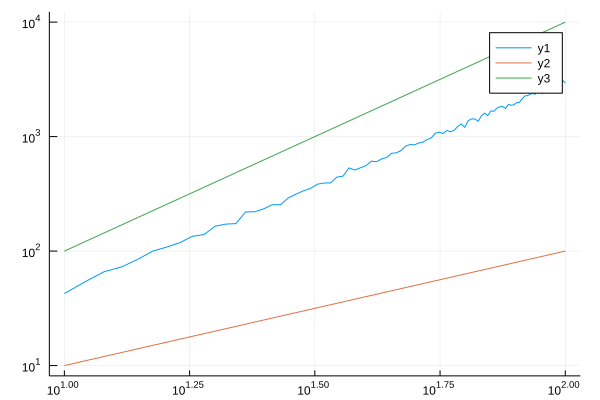

In [12]:
it = 10:1:100
res = areapercolation(it, 0.8, 100)
plot(it, res, xscale=:log10, yscale=:log10)
plot!(it, it, xscale=:log10, yscale=:log10)
plot!(it, it.^2, xscale=:log10, yscale=:log10)